# Definition and study of the features to use for the classification task

We import the libraries:

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import sys
import os
import seaborn as sns
import json
sys.path.append(os.path.abspath('..'))
from plot_utils import *
%matplotlib inline
from classification_utils import *
from enum import Enum
import pyproj
from sklearn.decomposition import PCA
from sklearn.preprocessing import MinMaxScaler, StandardScaler, RobustScaler
from imblearn.over_sampling import RandomOverSampler, SMOTENC
from sklearn.model_selection import train_test_split
pd.set_option('display.max_columns', None)
pd.set_option('max_colwidth', None)

We load the dataset, reaname some columns and drop incidents tags previously computed:

In [2]:
incidents_df = pd.read_csv(
    '../data/incidents_cleaned.csv',
    index_col=0,
    parse_dates=['date', 'date_original'],
    date_parser=lambda x: pd.to_datetime(x, format='%Y-%m-%d')
)
incidents_df.drop_duplicates(inplace=True)
incidents_df.rename(
    columns={
        'min_age_participants': 'min_age',
        'avg_age_participants': 'avg_age',
        'max_age_participants': 'max_age',
        'n_participants_child': 'n_child',
        'n_participants_teen': 'n_teen',
        'n_participants_adult': 'n_adult',
        'location_importance': 'location_imp',
        'party': 'democrat'
    },
    inplace=True
)
old_tags = [
    'firearm', 'air_gun', 'shots', 'aggression', 'suicide', 'injuries',
    'death', 'road', 'illegal_holding', 'house', 'school', 'children',
    'drugs', 'officers', 'organized', 'social_reasons', 'defensive',
    'workplace', 'abduction', 'unintentional'
]
incidents_df.drop(columns=old_tags, inplace=True)
dataset_original_columns = incidents_df.columns

We project latitude and longitude on the cartesian plane:

In [3]:
projector = pyproj.Proj(proj='utm', zone=14, ellps='WGS84', preserve_units=True) # UTM zone 14, US centered
incidents_df['x'], incidents_df['y'] = projector(incidents_df['longitude'], incidents_df['latitude'])

We plot the projection to check if it is correct:

(-7145557.213810375, 3490225.5387723297, 2526068.7285733647, 9157444.482326226)

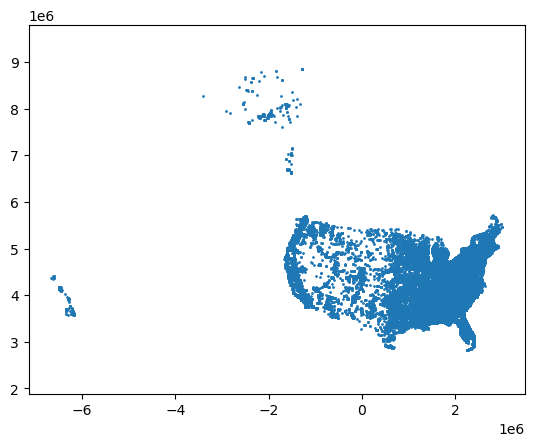

In [4]:
plt.plot(incidents_df['x'], incidents_df['y'], 'o', markersize=1)
plt.axis('equal')

We define a function to compute ratio indicators:

In [5]:
def compute_record_level_ratio_indicator(df, num, den):
    df[num+'_'+den+'_ratio'] = df[num] / df[den]
    return df

We use the function defined above to compute the ratio between the cardinality of a subset of participants and the total number of participants involved in the incident and we visualize the distributions of the computed indicators:

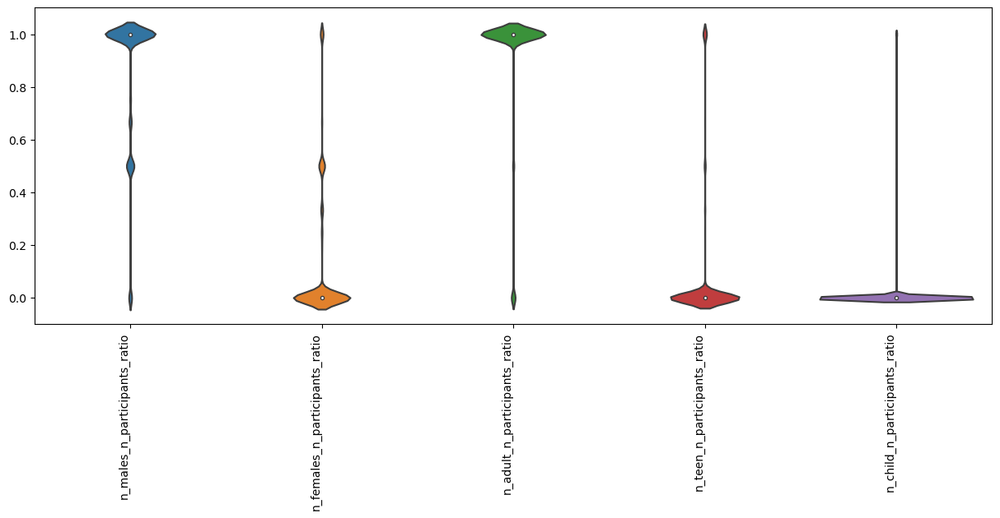

In [6]:
incident_ratio_num_columns = ['n_males', 'n_females', 'n_adult', 'n_teen', 'n_child']
for feature in incident_ratio_num_columns:
    incidents_df = compute_record_level_ratio_indicator(df=incidents_df, num=feature, den='n_participants')
# store the names of the new features
record_level_ratios = []
for feature in incidents_df.columns:
    if 'ratio' in feature:
        record_level_ratios.append(feature)
# visualize the distributions of the features
fig, ax = plt.subplots(figsize=(15, 5))
sns.violinplot(data=incidents_df[record_level_ratios], ax=ax)
plt.xticks(rotation=90, ha='right');

We compute the age range of the participants involved in the incident and we visualize its distribution:

<Axes: >

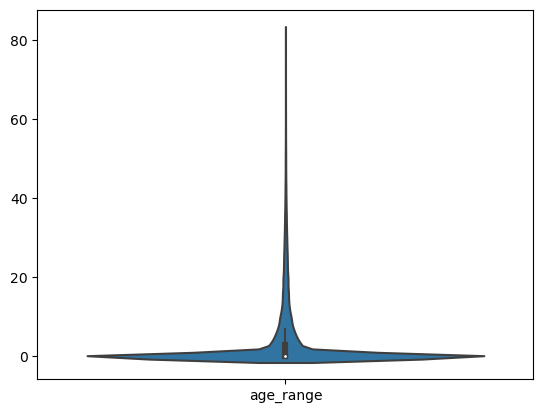

In [7]:
incidents_df['age_range'] = incidents_df['max_age'] - incidents_df['min_age']
sns.violinplot(data=incidents_df[['age_range']])

We compute binary tags describing the incident characteristics to use as indicators for the classification task:

In [8]:
class TagForClassification(Enum):
    aggression = 1
    accidental = 2
    defensive = 3
    suicide = 4

    road = 5
    house = 6
    school = 7
    business = 8

    illegal_holding = 9
    drug_alcohol = 10
    officers = 11

    organized = 12
    social_reasons = 13 
    abduction = 14

tags_map = {
    'ATF/LE Confiscation/Raid/Arrest': [TagForClassification.illegal_holding.name, TagForClassification.officers.name],
    'Accidental Shooting': [TagForClassification.accidental.name],
    'Accidental Shooting - Death': [TagForClassification.accidental.name],
    'Accidental Shooting - Injury': [TagForClassification.accidental.name],
    'Accidental Shooting at a Business': [TagForClassification.business.name, TagForClassification.accidental.name],
    'Accidental/Negligent Discharge': [TagForClassification.accidental.name],
    'Animal shot/killed': [],
    'Armed robbery with injury/death and/or evidence of DGU found': [TagForClassification.aggression.name, TagForClassification.business.name],
    'Assault weapon (AR-15, AK-47, and ALL variants defined by law enforcement)': [],
    'Attempted Murder/Suicide (one variable unsuccessful)': [TagForClassification.aggression.name, TagForClassification.suicide.name],
    'BB/Pellet/Replica gun': [],
    'Bar/club incident - in or around establishment': [TagForClassification.drug_alcohol.name, TagForClassification.business.name],
    'Brandishing/flourishing/open carry/lost/found': [TagForClassification.illegal_holding.name],
    'Car-jacking': [TagForClassification.aggression.name, TagForClassification.road.name],
    'Child Involved Incident': [],
    'Child picked up & fired gun': [],
    'Child with gun - no shots fired': [],
    'Cleaning gun': [TagForClassification.accidental.name],
    'Concealed Carry License - Perpetrator': [],
    'Concealed Carry License - Victim': [],
    'Criminal act with stolen gun': [TagForClassification.illegal_holding.name, TagForClassification.aggression.name],
    'Defensive Use': [TagForClassification.defensive.name],
    'Defensive Use - Crime occurs, victim shoots subject/suspect/perpetrator': [TagForClassification.defensive.name],
    'Defensive Use - Shots fired, no injury/death': [TagForClassification.defensive.name],
    'Defensive Use - Victim stops crime': [TagForClassification.defensive.name],
    'Defensive Use - WITHOUT a gun': [TagForClassification.defensive.name],
    'Domestic Violence': [TagForClassification.house.name, TagForClassification.aggression.name],
    'Drive-by (car to street, car to car)': [TagForClassification.aggression.name, TagForClassification.road.name],
    'Drug involvement': [TagForClassification.drug_alcohol.name],
    'Gang involvement': [TagForClassification.organized.name],
    'Ghost gun': [],
    'Gun at school, no death/injury - elementary/secondary school': [TagForClassification.school.name, TagForClassification.aggression.name],
    'Gun at school, no death/injury - university/college': [TagForClassification.school.name, TagForClassification.aggression.name],
    'Gun buy back action': [],
    'Gun range/gun shop/gun show shooting': [],
    'Gun shop robbery or burglary': [TagForClassification.illegal_holding.name, TagForClassification.business.name],
    'Gun(s) stolen from owner': [TagForClassification.illegal_holding.name],
    'Guns stolen from law enforcement': [TagForClassification.illegal_holding.name, TagForClassification.officers.name],
    'Hate crime': [TagForClassification.social_reasons.name, TagForClassification.aggression.name],
    'Home Invasion': [TagForClassification.house.name, TagForClassification.aggression.name],
    'Home Invasion - No death or injury': [TagForClassification.house.name, TagForClassification.aggression.name],
    'Home Invasion - Resident injured': [TagForClassification.aggression.name, TagForClassification.house.name],
    'Home Invasion - Resident killed': [TagForClassification.aggression.name, TagForClassification.house.name],
    'Home Invasion - subject/suspect/perpetrator injured': [TagForClassification.house.name, TagForClassification.defensive.name],
    'Home Invasion - subject/suspect/perpetrator killed': [TagForClassification.house.name, TagForClassification.defensive.name],
    'House party': [TagForClassification.house.name, TagForClassification.drug_alcohol.name],
    'Hunting accident': [TagForClassification.accidental.name],
    'Implied Weapon': [],
    'Institution/Group/Business': [TagForClassification.business.name],
    'Kidnapping/abductions/hostage': [TagForClassification.aggression.name, TagForClassification.abduction.name],
    'LOCKDOWN/ALERT ONLY: No GV Incident Occurred Onsite': [],
    'Mass Murder (4+ deceased victims excluding the subject/suspect/perpetrator , one location)': [TagForClassification.aggression.name],
    'Mass Shooting (4+ victims injured or killed excluding the subject/suspect/perpetrator, one location)': [TagForClassification.aggression.name],
    'Murder/Suicide': [TagForClassification.aggression.name, TagForClassification.suicide.name],
    'Non-Aggression Incident': [],
    'Non-Shooting Incident': [],
    'Officer Involved Incident': [TagForClassification.officers.name],
    'Officer Involved Incident - Weapon involved but no shots fired': [TagForClassification.officers.name],
    'Officer Involved Shooting - Accidental discharge - no injury required': [TagForClassification.officers.name, TagForClassification.accidental.name],
    'Officer Involved Shooting - Officer killed': [TagForClassification.aggression.name, TagForClassification.officers.name],
    'Officer Involved Shooting - Officer shot': [TagForClassification.officers.name, TagForClassification.aggression.name],
    'Officer Involved Shooting - Shots fired, no injury': [TagForClassification.officers.name],
    'Officer Involved Shooting - subject/suspect/perpetrator killed': [TagForClassification.officers.name, TagForClassification.defensive.name],
    'Officer Involved Shooting - subject/suspect/perpetrator shot': [TagForClassification.officers.name, TagForClassification.defensive.name],
    'Officer Involved Shooting - subject/suspect/perpetrator suicide at standoff': [TagForClassification.officers.name, TagForClassification.suicide.name],
    'Officer Involved Shooting - subject/suspect/perpetrator surrender at standoff': [TagForClassification.officers.name],
    'Officer Involved Shooting - subject/suspect/perpetrator unarmed': [TagForClassification.officers.name],
    'Pistol-whipping': [TagForClassification.aggression.name],
    'Police Targeted': [TagForClassification.officers.name, TagForClassification.aggression.name],
    'Political Violence': [TagForClassification.aggression.name, TagForClassification.social_reasons.name],
    'Possession (gun(s) found during commission of other crimes)': [],
    'Possession of gun by felon or prohibited person': [TagForClassification.illegal_holding.name],
    'Road rage': [TagForClassification.road.name, TagForClassification.aggression.name],
    'School Incident': [TagForClassification.school.name, TagForClassification.aggression.name],
    'School Shooting - elementary/secondary school': [TagForClassification.aggression.name, TagForClassification.school.name],
    'Sex crime involving firearm': [TagForClassification.aggression.name],
    'Shootout (where VENN diagram of shooters and victims overlap)': [TagForClassification.aggression.name],
    'Shot - Dead (murder, accidental, suicide)': [],
    'Shot - Wounded/Injured': [],
    'ShotSpotter': [],
    'Shots Fired - No Injuries': [],
    'Shots fired, no action (reported, no evidence found)': [],
    'Spree Shooting (multiple victims, multiple locations)': [TagForClassification.aggression.name],
    'Stolen/Illegally owned gun{s} recovered during arrest/warrant': [TagForClassification.illegal_holding.name],
    'Suicide - Attempt': [TagForClassification.suicide.name],
    'Suicide^': [TagForClassification.suicide.name],
    'TSA Action': [TagForClassification.officers.name],
    'Terrorism Involvement': [TagForClassification.aggression.name, TagForClassification.organized.name],
    'Under the influence of alcohol or drugs (only applies to the subject/suspect/perpetrator )': [TagForClassification.drug_alcohol.name],
    'Unlawful purchase/sale': [TagForClassification.illegal_holding.name],
    'Workplace shooting (disgruntled employee)': [TagForClassification.aggression.name, TagForClassification.business.name]
}

def set_tags(row):
    if pd.notnull(row['incident_characteristics1']):
        for tag in tags_map[row['incident_characteristics1']]:
            row[tag] = 1
    if pd.notnull(row['incident_characteristics2']):
        for tag in tags_map[row['incident_characteristics2']]:
            row[tag] = 1
    return row

def add_tags(df):
    for tag in TagForClassification:
        df[tag.name] = 0
    df = df.apply(set_tags, axis=1)
    return df

incidents_df = add_tags(incidents_df)

We search for inconsistencies:

In [9]:
incidents_df[(incidents_df['aggression']==1) & (incidents_df['defensive']==1)] # such incidents involve a defensive act, in response to an aggression

,date_original,year,month,day,day_of_week,state,address,latitude,longitude,county,city,location_imp,address_type,congressional_district,state_house_district,state_senate_district,px_code,participant_age1,participant1_child,participant1_teen,participant1_adult,participant1_male,participant1_female,min_age,avg_age,max_age,n_child,n_teen,n_adult,n_males,n_females,n_killed,n_injured,n_arrested,n_unharmed,n_participants,notes,incident_characteristics1,incident_characteristics2,poverty_perc,democrat,candidate_votes,total_votes,candidate_perc,population_state_2010,x,y,n_males_n_participants_ratio,n_females_n_participants_ratio,n_adult_n_participants_ratio,n_teen_n_participants_ratio,n_child_n_participants_ratio,age_range,aggression,accidental,defensive,suicide,road,house,school,business,illegal_holding,drug_alcohol,officers,organized,social_reasons,abduction
date,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2014-09-16,2014-09-16,2014.0,9,16,1,ALABAMA,22000 of Fain Road,34.9203,-86.9240,Limestone County,NaN,1.000000e-07,place,5.0,5.0,1.0,AL,32.0,False,False,True,True,False,32.0,36.0,41.0,0.0,0.0,4.0,3.0,1.0,0.0,0.0,0.0,4.0,4.0,Armed homeowner stops burglars,Home Invasion,Home Invasion - subject/suspect/perpetrator injured,16.8,REPUBLICAN,115338.0,154974.0,74.424097,4779736,1.605831e+06,3.931504e+06,0.750000,0.250000,1.0,0.0,0.0,9.0,1,0,1,0,0,1,0,0,0,0,0,0,0,0
2014-09-03,2014-09-03,2014.0,9,3,2,SOUTH CAROLINA,Decatur Dr,33.1108,-80.1116,Berkeley County,NaN,1.000000e-07,place,1.0,100.0,44.0,SC,32.0,False,False,True,False,True,2.0,17.0,32.0,2.0,0.0,2.0,2.0,2.0,0.0,1.0,0.0,3.0,4.0,"broke into home alleging to sell vacuums; pw woman; hit children, no gun-related injuries to them; no shots fired;\r\r\r\r\n33.110848, -80.111656",Home Invasion,Home Invasion - subject/suspect/perpetrator injured,14.9,REPUBLICAN,119392.0,127815.0,93.410007,4625364,2.275009e+06,3.826998e+06,0.500000,0.500000,0.5,0.0,0.5,30.0,1,0,1,0,0,1,0,0,0,0,0,0,0,0
NaT,2030-10-01,NaN,10,1,1,TEXAS,6900 block of Rolling Creek Lane,32.6643,-96.9362,Dallas County,Dallas,1.000000e-05,building,30.0,111.0,23.0,NaN,NaN,False,False,True,True,False,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,3.0,3.0,1.0,4.0,Perps assault homeowner in a robbery and beat him but he grabs gun when they leave and shoots three of them.,Home Invasion,Home Invasion - subject/suspect/perpetrator injured,NaN,NaN,NaN,NaN,NaN,25145561,6.935360e+05,3.615954e+06,NaN,NaN,NaN,NaN,NaN,NaN,1,0,1,0,0,1,0,0,0,0,0,0,0,0
2014-10-27,2014-10-27,2014.0,10,27,0,INDIANA,NaN,41.5736,-87.1846,Porter County,Portage,1.000000e-07,place,1.0,10.0,4.0,IN,75.0,False,False,True,True,False,29.0,52.0,75.0,0.0,0.0,2.0,2.0,0.0,0.0,0.0,0.0,2.0,2.0,"Victim holds fugitive at gunpoint. Victim's 2 dogs attack officer and K9, sending them to hospital.",Domestic Violence,Defensive Use,13.3,DEMOCRAT,86579.0,142293.0,60.845579,6483802,1.485836e+06,4.670401e+06,1.000000,0.000000,1.0,0.0,0.0,46.0,1,0,1,0,0,1,0,0,0,0,0,0,0,0
NaT,2029-02-10,NaN,2,10,5,TEXAS,Boulevard Spirits liquor store at 5715 Randolph Blvd,29.5355,-98.3766,Bexar County,San Antonio,1.000000e-07,place,35.0,121.0,25.0,NaN,NaN,False,False,True,True,False,NaN,NaN,NaN,0.0,0.0,2.0,2.0,0.0,1.0,0.0,0.0,1.0,2.0,Clerk fatally shot robber at convenience store.,Armed robbery with injury/death and/or evidence of DGU found,Defensive Use,NaN,NaN,NaN,NaN,NaN,25145561,5.604041e+05,3.267479e+06,1.000000,0.000000,1.0,0.0,0.0,NaN,1,0,1,0,0,0,0,1,0,0,0,0,0,0
2014-10-16,2014-10-16,2014.0,10,16,3,MICHIGAN,Clio Road,43.0639,-83.7334,Genesee County,NaN,1.000000e-07,place,5.0,48.0,26.0,MI,NaN,False,False,True,NaN,NaN,NaN,NaN,NaN,0.0,0.0,2.0,NaN,NaN,0.0,0.0,0.0,2.0,2.0,"Robber with knife, held by victim with gun until police came.",Armed robbery with injury/death and/or evidence of DGU found,Defensive Use,12.9,DEMOCRAT,148182.0,222138.0,66.707182,9883640,1.743934e+06,4.882481e+06,NaN,NaN,1.0,0.0,0.0,NaN,1,0,1,0,0,0,0,1,0,0,0,0,0,0
2014-05-09,2014-05-09,2014.0,5,9,4,MISSISSIPPI,22nd Avenue Heights,

In [10]:
incidents_df[(incidents_df['aggression']==1) & (incidents_df['accidental']==1)]

,date_original,year,month,day,day_of_week,state,address,latitude,longitude,county,city,location_imp,address_type,congressional_district,state_house_district,state_senate_district,px_code,participant_age1,participant1_child,participant1_teen,participant1_adult,participant1_male,participant1_female,min_age,avg_age,max_age,n_child,n_teen,n_adult,n_males,n_females,n_killed,n_injured,n_arrested,n_unharmed,n_participants,notes,incident_characteristics1,incident_characteristics2,poverty_perc,democrat,candidate_votes,total_votes,candidate_perc,population_state_2010,x,y,n_males_n_participants_ratio,n_females_n_participants_ratio,n_adult_n_participants_ratio,n_teen_n_participants_ratio,n_child_n_participants_ratio,age_range,aggression,accidental,defensive,suicide,road,house,school,business,illegal_holding,drug_alcohol,officers,organized,social_reasons,abduction
date,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,


In [11]:
incidents_df[
    (incidents_df['aggression']==0) & 
    ((incidents_df['organized']==1))
]

,date_original,year,month,day,day_of_week,state,address,latitude,longitude,county,city,location_imp,address_type,congressional_district,state_house_district,state_senate_district,px_code,participant_age1,participant1_child,participant1_teen,participant1_adult,participant1_male,participant1_female,min_age,avg_age,max_age,n_child,n_teen,n_adult,n_males,n_females,n_killed,n_injured,n_arrested,n_unharmed,n_participants,notes,incident_characteristics1,incident_characteristics2,poverty_perc,democrat,candidate_votes,total_votes,candidate_perc,population_state_2010,x,y,n_males_n_participants_ratio,n_females_n_participants_ratio,n_adult_n_participants_ratio,n_teen_n_participants_ratio,n_child_n_participants_ratio,age_range,aggression,accidental,defensive,suicide,road,house,school,business,illegal_holding,drug_alcohol,officers,organized,social_reasons,abduction
date,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
NaT,2030-10-16,NaN,10,16,2,CALIFORNIA,2000 block of Martin Luther King Avenue,33.7935,-118.1810,Los Angeles County,Long Beach,1.000000e-07,place,47.0,70.0,33.0,NaN,NaN,False,False,True,True,False,NaN,NaN,NaN,0.0,0.0,1.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,NaN,Shot - Wounded/Injured,Gang involvement,NaN,NaN,NaN,NaN,NaN,37253956,-1.288071e+06,3.909566e+06,1.0,0.0,1.0,0.0,0.0,NaN,0,0,0,0,0,0,0,0,0,0,0,1,0,0
2016-03-18,2016-03-18,2016.0,3,18,4,ILLINOIS,3700 block of West Division Street,41.9027,-87.7188,Cook County,Chicago,1.000000e-05,building,7.0,4.0,2.0,IL,42.0,False,False,True,True,False,42.0,42.0,42.0,0.0,0.0,1.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0,"Humboldt Park - documented gang member found shot, chest, died in hospital;","Shot - Dead (murder, accidental, suicide)",Gang involvement,10.9,DEMOCRAT,250584.0,297466.0,84.239543,12830632,1.436336e+06,4.700962e+06,1.0,0.0,1.0,0.0,0.0,0.0,0,0,0,0,0,0,0,0,0,0,0,1,0,0
2017-02-09,2017-02-09,2017.0,2,9,3,ILLINOIS,6800 block of South Harper,41.7713,-87.5885,Cook County,Chicago,1.000000e-05,building,1.0,26.0,13.0,IL,18.0,False,False,True,True,False,18.0,18.0,18.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,"Documented gang member, back, left ear; stable",Shot - Wounded/Injured,Gang involvement,10.4,DEMOCRAT,234037.0,315862.0,74.094700,12830632,1.449134e+06,4.687795e+06,1.0,0.0,1.0,0.0,0.0,0.0,0,0,0,0,0,0,0,0,0,0,0,1,0,0
2015-02-13,2015-02-13,2015.0,2,13,4,MASSACHUSETTS,65 Wilmont Street,42.0894,-72.5592,Hampden County,Springfield,1.000000e-05,building,1.0,NaN,NaN,MA,23.0,False,False,True,True,False,23.0,24.0,25.0,0.0,0.0,2.0,2.0,0.0,0.0,0.0,2.0,0.0,2.0,"warrant, known gang members with drugs, cash, ammo, and Norvinco assault rifle, Mossberg .22 cal rifle, Marlin .22 cal rifle, 40 cal handgun, .22 cal handgun",Non-Shooting Incident,Gang involvement,10.6,DEMOCRAT,167612.0,227075.0,73.813498,6547629,2.692281e+06,5.012003e+06,1.0,0.0,1.0,0.0,0.0,2.0,0,0,0,0,0,0,0,0,0,0,0,1,0,0
2016-02-13,2016-02-13,2016.0,2,13,5,ILLINOIS,5200 block of West Congress,41.8739,-87.7549,Cook County,Chicago,1.000000e-05,building,7.0,8.0,4.0,IL,25.0,False,False,True,True,False,25.0,25.0,25.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,"Austin - documented gang member shot, foot, stable;",Shot - Wounded/Injured,Gang involvement,10.9,DEMOCRAT,250584.0,297466.0,84.239543,12830632,1.433762e+06,4.697359e+06,1.0,0.0,1.0,0.0,0.0,0.0,0,0,0,0,0,0,0,0,0,0,0,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
NaT,2030-03-25,NaN,3,25,0,FLORIDA,766 Marsh Avenue,26.6640,-81.8286,Lee County,Fort Myers,1.000000e-07,place,19.0,78.0,30.0,NaN,NaN,False,False,True,True,False,NaN,NaN,NaN,0.0,0.0,1.0,1.0,0.0,0.0,0.0,1.0,0.0,1.0,Latin King gang member,Non-Shooting Incident,Gang involvement,NaN,NaN,NaN,NaN,NaN,18801310,2.224116e+06,3.067497e+06,1.0,0.0,1.0,0.0,0.0,NaN,0,0,0,0,0,0,0,0,0,0,0,1,0,0
2014-08-01,2014-08-01,2014

In [12]:
incidents_df[
    (incidents_df['aggression']==0) & 
    ((incidents_df['social_reasons']==1))
]

,date_original,year,month,day,day_of_week,state,address,latitude,longitude,county,city,location_imp,address_type,congressional_district,state_house_district,state_senate_district,px_code,participant_age1,participant1_child,participant1_teen,participant1_adult,participant1_male,participant1_female,min_age,avg_age,max_age,n_child,n_teen,n_adult,n_males,n_females,n_killed,n_injured,n_arrested,n_unharmed,n_participants,notes,incident_characteristics1,incident_characteristics2,poverty_perc,democrat,candidate_votes,total_votes,candidate_perc,population_state_2010,x,y,n_males_n_participants_ratio,n_females_n_participants_ratio,n_adult_n_participants_ratio,n_teen_n_participants_ratio,n_child_n_participants_ratio,age_range,aggression,accidental,defensive,suicide,road,house,school,business,illegal_holding,drug_alcohol,officers,organized,social_reasons,abduction
date,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,


In [13]:
incidents_df[
    (incidents_df['aggression']==0) & 
    ((incidents_df['abduction']==1))
]

,date_original,year,month,day,day_of_week,state,address,latitude,longitude,county,city,location_imp,address_type,congressional_district,state_house_district,state_senate_district,px_code,participant_age1,participant1_child,participant1_teen,participant1_adult,participant1_male,participant1_female,min_age,avg_age,max_age,n_child,n_teen,n_adult,n_males,n_females,n_killed,n_injured,n_arrested,n_unharmed,n_participants,notes,incident_characteristics1,incident_characteristics2,poverty_perc,democrat,candidate_votes,total_votes,candidate_perc,population_state_2010,x,y,n_males_n_participants_ratio,n_females_n_participants_ratio,n_adult_n_participants_ratio,n_teen_n_participants_ratio,n_child_n_participants_ratio,age_range,aggression,accidental,defensive,suicide,road,house,school,business,illegal_holding,drug_alcohol,officers,organized,social_reasons,abduction
date,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,


In [14]:
incidents_df[
    (incidents_df['accidental']==1) & 
    (
        (incidents_df['aggression']==1) |
        (incidents_df['defensive']==1) |
        (incidents_df['suicide']==1) |
        (incidents_df['organized']==1) |
        (incidents_df['social_reasons']==1) |
        (incidents_df['abduction']==1)
    )
]

,date_original,year,month,day,day_of_week,state,address,latitude,longitude,county,city,location_imp,address_type,congressional_district,state_house_district,state_senate_district,px_code,participant_age1,participant1_child,participant1_teen,participant1_adult,participant1_male,participant1_female,min_age,avg_age,max_age,n_child,n_teen,n_adult,n_males,n_females,n_killed,n_injured,n_arrested,n_unharmed,n_participants,notes,incident_characteristics1,incident_characteristics2,poverty_perc,democrat,candidate_votes,total_votes,candidate_perc,population_state_2010,x,y,n_males_n_participants_ratio,n_females_n_participants_ratio,n_adult_n_participants_ratio,n_teen_n_participants_ratio,n_child_n_participants_ratio,age_range,aggression,accidental,defensive,suicide,road,house,school,business,illegal_holding,drug_alcohol,officers,organized,social_reasons,abduction
date,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2014-05-04,2014-05-04,2014.0,5,4,6,MICHIGAN,1200 Pinehurst Avenue,42.9831,-83.6958,Genesee County,Flint,1.000000e-07,place,5.0,49.0,27.0,MI,36.0,False,False,True,True,False,21.0,28.0,36.0,0.0,0.0,2.0,1.0,1.0,0.0,2.0,0.0,0.0,2.0,Apparent suicide attempt also critically wounds g/f.,Suicide - Attempt,Accidental Shooting,12.9,DEMOCRAT,148182.0,222138.0,66.707182,9883640,1.748679e+06,4.874063e+06,0.5,0.5,1.0,0.0,0.0,15.0,0,1,0,1,0,0,0,0,0,0,0,0,0,0
2014-05-30,2014-05-30,2014.0,5,30,4,MICHIGAN,E Highland Rd and Duck Lake Rd N,42.6539,-83.5741,Oakland County,Highland Charter Township,1.000100e-01,road,11.0,44.0,14.0,MI,22.0,False,False,True,True,False,22.0,22.0,22.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,"Suicidal man arrested for waving gun around. Loaded gun found, note found. In psychiatric hosp.;\r\r\r\r\n42.653864, -83.574134",Suicide - Attempt,Accidental Shooting,12.9,REPUBLICAN,140435.0,251238.0,55.897197,9883640,1.765493e+06,4.839290e+06,1.0,0.0,1.0,0.0,0.0,0.0,0,1,0,1,0,0,0,0,0,0,0,0,0,0


In [15]:
incidents_df[
    (incidents_df['defensive']==1) & 
    (incidents_df['accidental']==1)
]

,date_original,year,month,day,day_of_week,state,address,latitude,longitude,county,city,location_imp,address_type,congressional_district,state_house_district,state_senate_district,px_code,participant_age1,participant1_child,participant1_teen,participant1_adult,participant1_male,participant1_female,min_age,avg_age,max_age,n_child,n_teen,n_adult,n_males,n_females,n_killed,n_injured,n_arrested,n_unharmed,n_participants,notes,incident_characteristics1,incident_characteristics2,poverty_perc,democrat,candidate_votes,total_votes,candidate_perc,population_state_2010,x,y,n_males_n_participants_ratio,n_females_n_participants_ratio,n_adult_n_participants_ratio,n_teen_n_participants_ratio,n_child_n_participants_ratio,age_range,aggression,accidental,defensive,suicide,road,house,school,business,illegal_holding,drug_alcohol,officers,organized,social_reasons,abduction
date,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,


In [16]:
incidents_df[
    (incidents_df['defensive']==1) & 
    (incidents_df['suicide']==1)
]

,date_original,year,month,day,day_of_week,state,address,latitude,longitude,county,city,location_imp,address_type,congressional_district,state_house_district,state_senate_district,px_code,participant_age1,participant1_child,participant1_teen,participant1_adult,participant1_male,participant1_female,min_age,avg_age,max_age,n_child,n_teen,n_adult,n_males,n_females,n_killed,n_injured,n_arrested,n_unharmed,n_participants,notes,incident_characteristics1,incident_characteristics2,poverty_perc,democrat,candidate_votes,total_votes,candidate_perc,population_state_2010,x,y,n_males_n_participants_ratio,n_females_n_participants_ratio,n_adult_n_participants_ratio,n_teen_n_participants_ratio,n_child_n_participants_ratio,age_range,aggression,accidental,defensive,suicide,road,house,school,business,illegal_holding,drug_alcohol,officers,organized,social_reasons,abduction
date,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,


In [17]:
incidents_df[
    (incidents_df['suicide']==1) & 
    (incidents_df['accidental']==1)
]

,date_original,year,month,day,day_of_week,state,address,latitude,longitude,county,city,location_imp,address_type,congressional_district,state_house_district,state_senate_district,px_code,participant_age1,participant1_child,participant1_teen,participant1_adult,participant1_male,participant1_female,min_age,avg_age,max_age,n_child,n_teen,n_adult,n_males,n_females,n_killed,n_injured,n_arrested,n_unharmed,n_participants,notes,incident_characteristics1,incident_characteristics2,poverty_perc,democrat,candidate_votes,total_votes,candidate_perc,population_state_2010,x,y,n_males_n_participants_ratio,n_females_n_participants_ratio,n_adult_n_participants_ratio,n_teen_n_participants_ratio,n_child_n_participants_ratio,age_range,aggression,accidental,defensive,suicide,road,house,school,business,illegal_holding,drug_alcohol,officers,organized,social_reasons,abduction
date,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2014-05-04,2014-05-04,2014.0,5,4,6,MICHIGAN,1200 Pinehurst Avenue,42.9831,-83.6958,Genesee County,Flint,1.000000e-07,place,5.0,49.0,27.0,MI,36.0,False,False,True,True,False,21.0,28.0,36.0,0.0,0.0,2.0,1.0,1.0,0.0,2.0,0.0,0.0,2.0,Apparent suicide attempt also critically wounds g/f.,Suicide - Attempt,Accidental Shooting,12.9,DEMOCRAT,148182.0,222138.0,66.707182,9883640,1.748679e+06,4.874063e+06,0.5,0.5,1.0,0.0,0.0,15.0,0,1,0,1,0,0,0,0,0,0,0,0,0,0
2014-05-30,2014-05-30,2014.0,5,30,4,MICHIGAN,E Highland Rd and Duck Lake Rd N,42.6539,-83.5741,Oakland County,Highland Charter Township,1.000100e-01,road,11.0,44.0,14.0,MI,22.0,False,False,True,True,False,22.0,22.0,22.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,"Suicidal man arrested for waving gun around. Loaded gun found, note found. In psychiatric hosp.;\r\r\r\r\n42.653864, -83.574134",Suicide - Attempt,Accidental Shooting,12.9,REPUBLICAN,140435.0,251238.0,55.897197,9883640,1.765493e+06,4.839290e+06,1.0,0.0,1.0,0.0,0.0,0.0,0,1,0,1,0,0,0,0,0,0,0,0,0,0


In [18]:
incidents_df[
    (incidents_df['organized']==1) & 
    (incidents_df['accidental']==1)
]

,date_original,year,month,day,day_of_week,state,address,latitude,longitude,county,city,location_imp,address_type,congressional_district,state_house_district,state_senate_district,px_code,participant_age1,participant1_child,participant1_teen,participant1_adult,participant1_male,participant1_female,min_age,avg_age,max_age,n_child,n_teen,n_adult,n_males,n_females,n_killed,n_injured,n_arrested,n_unharmed,n_participants,notes,incident_characteristics1,incident_characteristics2,poverty_perc,democrat,candidate_votes,total_votes,candidate_perc,population_state_2010,x,y,n_males_n_participants_ratio,n_females_n_participants_ratio,n_adult_n_participants_ratio,n_teen_n_participants_ratio,n_child_n_participants_ratio,age_range,aggression,accidental,defensive,suicide,road,house,school,business,illegal_holding,drug_alcohol,officers,organized,social_reasons,abduction
date,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,


In [19]:
incidents_df[
    (incidents_df['social_reasons']==1) & 
    (incidents_df['accidental']==1)
]

,date_original,year,month,day,day_of_week,state,address,latitude,longitude,county,city,location_imp,address_type,congressional_district,state_house_district,state_senate_district,px_code,participant_age1,participant1_child,participant1_teen,participant1_adult,participant1_male,participant1_female,min_age,avg_age,max_age,n_child,n_teen,n_adult,n_males,n_females,n_killed,n_injured,n_arrested,n_unharmed,n_participants,notes,incident_characteristics1,incident_characteristics2,poverty_perc,democrat,candidate_votes,total_votes,candidate_perc,population_state_2010,x,y,n_males_n_participants_ratio,n_females_n_participants_ratio,n_adult_n_participants_ratio,n_teen_n_participants_ratio,n_child_n_participants_ratio,age_range,aggression,accidental,defensive,suicide,road,house,school,business,illegal_holding,drug_alcohol,officers,organized,social_reasons,abduction
date,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,


In [20]:
incidents_df[
    (incidents_df['abduction']==1) & 
    (incidents_df['accidental']==1)
]

,date_original,year,month,day,day_of_week,state,address,latitude,longitude,county,city,location_imp,address_type,congressional_district,state_house_district,state_senate_district,px_code,participant_age1,participant1_child,participant1_teen,participant1_adult,participant1_male,participant1_female,min_age,avg_age,max_age,n_child,n_teen,n_adult,n_males,n_females,n_killed,n_injured,n_arrested,n_unharmed,n_participants,notes,incident_characteristics1,incident_characteristics2,poverty_perc,democrat,candidate_votes,total_votes,candidate_perc,population_state_2010,x,y,n_males_n_participants_ratio,n_females_n_participants_ratio,n_adult_n_participants_ratio,n_teen_n_participants_ratio,n_child_n_participants_ratio,age_range,aggression,accidental,defensive,suicide,road,house,school,business,illegal_holding,drug_alcohol,officers,organized,social_reasons,abduction
date,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,


In [21]:
incidents_df[(incidents_df['aggression']==0) & (incidents_df['accidental']==0) & (incidents_df['defensive']==0) & (incidents_df['suicide']==0)]

,date_original,year,month,day,day_of_week,state,address,latitude,longitude,county,city,location_imp,address_type,congressional_district,state_house_district,state_senate_district,px_code,participant_age1,participant1_child,participant1_teen,participant1_adult,participant1_male,participant1_female,min_age,avg_age,max_age,n_child,n_teen,n_adult,n_males,n_females,n_killed,n_injured,n_arrested,n_unharmed,n_participants,notes,incident_characteristics1,incident_characteristics2,poverty_perc,democrat,candidate_votes,total_votes,candidate_perc,population_state_2010,x,y,n_males_n_participants_ratio,n_females_n_participants_ratio,n_adult_n_participants_ratio,n_teen_n_participants_ratio,n_child_n_participants_ratio,age_range,aggression,accidental,defensive,suicide,road,house,school,business,illegal_holding,drug_alcohol,officers,organized,social_reasons,abduction
date,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2015-05-02,2015-05-02,2015.0,5,2,5,INDIANA,Lafayette Road and Pike Plaza,39.8322,-86.2492,Marion County,Indianapolis,1.000100e-01,road,7.0,94.0,33.0,IN,19.0,False,False,True,True,False,19.0,19.0,19.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,Teen wounded while walking - Security guard at nearby carnival aided victim.,Shot - Wounded/Injured,NaN,12.3,DEMOCRAT,61443.0,112261.0,54.732276,6483802,1.592644e+06,4.487723e+06,1.0,0.0,1.0,0.0,0.0,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2016-11-05,2016-11-05,2016.0,11,5,5,MICHIGAN,6200 Block of East McNichols Road,42.4190,-83.0393,Wayne County,Detroit,1.000000e-07,place,14.0,4.0,2.0,MI,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,1.0,0.0,1.0,2.0,1 inj.,Shot - Wounded/Injured,NaN,11.0,DEMOCRAT,244135.0,310974.0,78.506563,9883640,1.814493e+06,4.821504e+06,NaN,NaN,NaN,NaN,NaN,NaN,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2016-10-15,2016-10-15,2016.0,10,15,5,DISTRICT OF COLUMBIA,"1000 block of Bladensburg Road, NE",38.9030,-76.9820,Trinidad,Washington,1.000000e-05,building,0.0,NaN,NaN,DC,NaN,False,False,True,True,False,NaN,NaN,NaN,NaN,NaN,NaN,1.0,0.0,0.0,1.0,0.0,0.0,2.0,NaN,Shot - Wounded/Injured,NaN,14.9,DEMOCRAT,265178.0,300906.0,88.126525,601723,2.418355e+06,4.544035e+06,0.5,0.0,NaN,NaN,NaN,NaN,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2018-01-25,2018-01-25,2018.0,1,25,3,LOUISIANA,18733 Samuels Rd,30.6069,-91.2270,East Baton Rouge Parish,NaN,1.000100e-01,road,6.0,63.0,15.0,LA,30.0,False,False,True,True,False,20.0,26.0,30.0,0.0,0.0,5.0,5.0,0.0,2.0,1.0,2.0,0.0,5.0,Good Samaritan shot aggressors - was arrested for felon in possession of gun.,Shot - Wounded/Injured,"Shot - Dead (murder, accidental, suicide)",17.5,REPUBLICAN,186553.0,268525.0,69.473233,4533372,1.246192e+06,3.411908e+06,1.0,0.0,1.0,0.0,0.0,10.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2016-03-16,2016-03-16,2016.0,3,16,2,CONNECTICUT,560 Ella T Grasso Boulevard,41.2945,-72.9457,South Central Connecticut Planning Region,New Haven,1.000000e-05,place,3.0,116.0,10.0,CT,NaN,False,True,False,True,False,NaN,NaN,NaN,0.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,1.0,"student hid Ruger 357 gun in coat, no shots fired",Institution/Group/Business,Non-Shooting Incident,9.9,DEMOCRAT,192274.0,309379.0,62.148368,3574097,2.689054e+06,4.912525e+06,1.0,0.0,0.0,1.0,0.0,NaN,0,0,0,0,0,0,0,1,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2015-10-31,2015-10-31,2015.0,10,31,5,NEW JERSEY,50 Riverview Plaza,40.2024,-74.7585,Mercer County,Trenton,1.000000e-07,place,12.0,15.0,15.0,NJ,24.0,False,False,True,True,False,24.0,27.0,30.0,0.0,0.0,2.0,1.0,1.0,0.0,2.0,0.0,0.0,2.0,NaN,Shot - Wounded/Injured,Bar/club incident - in or around establishment,9.7,DEMOCRAT,90430.0,148366.0,60.950622,8791894,2.572035e+06,4.742700e+06,0.5,0.5,1.0,0.0,0.0,6.0,0,0,0,0,0,0,0,1,0,1,0,0,0,0
2015-05-11,2015-05-11,2015.0,5,11,0,MARYLAND,Central Avenue and Addison Road,38.8869,-76

We rename some indicators:

In [22]:
indicators_abbr = {
    'n_child_n_participants_ratio': 'n_child_prop',
    'n_teen_n_participants_ratio': 'n_teen_prop',
    'n_males_n_participants_ratio': 'n_males_prop',
}
incidents_df.rename(columns=indicators_abbr, inplace=True)

We convert to 0 or 1 the attribute indicating if the incident happened in a state with a democratic or republican governor:

In [23]:
incidents_df['democrat'].replace(['REPUBLICAN', 'DEMOCRAT'], [0, 1], inplace=True)

We convert to categorical codes the state attributes:

In [24]:
incidents_df['state_code'] = incidents_df['state'].astype('category').cat.codes

We convert months and days of week to their names:

In [25]:
incidents_df['month_name'] = incidents_df['month'].apply(lambda x: pd.to_datetime(x, format='%m').month_name())
incidents_df['day_of_week_name'] = incidents_df['date_original'].dt.day_name()

We compute the number of dayes from the first incident:

In [26]:
incidents_df['days_from_first_incident'] = (incidents_df['date_original'] - incidents_df['date_original'].min()).dt.days

We perform a cyclic encoding of the month, the day and the day of the week:

In [27]:
incidents_df['month_x'] = np.sin(2 * np.pi * incidents_df['month'] / 12.0)
incidents_df['month_y'] = np.cos(2 * np.pi * incidents_df['month'] / 12.0)

incidents_df['day_x'] = np.sin(2 * np.pi * incidents_df['day'] / 31.0)
incidents_df['day_y'] = np.cos(2 * np.pi * incidents_df['day'] / 31.0)

incidents_df['day_of_week_x'] = np.sin(2 * np.pi * incidents_df['day_of_week'] / 7.0)
incidents_df['day_of_week_y'] = np.cos(2 * np.pi * incidents_df['day_of_week'] / 7.0)

We visualize the distributions of the encoded attributes:

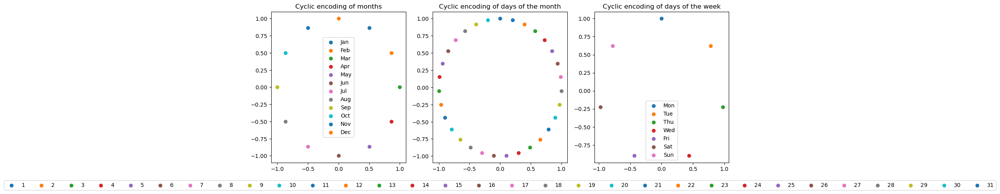

In [28]:
fig, axs = plt.subplots(1, 3, figsize=(15, 5))

sns.set_palette('tab20')
months = np.arange(1, 13)
months_names = ['Jan','Feb','Mar','Apr','May','Jun','Jul','Aug','Sep','Oct','Nov','Dec']
month_xs = np.sin(2 * np.pi * np.array(months) / 12.0)
month_ys = np.cos(2 * np.pi * np.array(months) / 12.0)
for month_name, month_x, month_y in zip(months_names, month_xs, month_ys):
    axs[0].scatter(
        x=month_x,
        y=month_y,
        label=month_name
    )
axs[0].legend()
axs[0].set_title('Cyclic encoding of months')

month_days = np.arange(1, 32)
month_days_xs = np.sin(2 * np.pi * np.array(month_days) / 31.0)
month_days_ys = np.cos(2 * np.pi * np.array(month_days) / 31.0)
for month_day, month_day_x, month_day_y in zip(month_days, month_days_xs, month_days_ys):
    axs[1].scatter(
        x=month_day_x,
        y=month_day_y,
        label=month_day
    )
axs[1].set_title('Cyclic encoding of days of the month')
axs[1].legend(loc='lower center', ncols=31, bbox_to_anchor=(0.5, -0.2))

sns.set_palette('tab10')
days = np.arange(0, 7)
days_names = ['Mon', 'Tue', 'Thu', 'Wed', 'Fri', 'Sat', 'Sun']
days_xs = np.sin(2 * np.pi * np.array(days) / 7.0)
days_ys = np.cos(2 * np.pi * np.array(days) / 7.0)
for day, day_x, day_y in zip(days_names, days_xs, days_ys):
    axs[2].scatter(
        x=day_x,
        y=day_y,
        label=day
    )
axs[2].set_title('Cyclic encoding of days of the week')
axs[2].legend()

We load the data about the gun laws strictness:

In [29]:
laws_df = pd.read_csv('../data/external_data/gun_law_rank.csv')
laws_df

,state,gun_law_rank,year
0,CALIFORNIA,3,2013
1,CONNECTICUT,3,2013
2,NEW JERSEY,3,2013
3,MARYLAND,3,2013
4,NEW YORK,3,2013
...,...,...,...
301,WASHINGTON,4,2018
302,WEST VIRGINIA,13,2018
303,WISCONSIN,9,2018
304,WYOMING,13,2018


We merge the datasets:

In [30]:
incidents_df = incidents_df.merge(laws_df, how='left', on=['state', 'year'])

We define the list of indicators to use for the classification task:

In [31]:
indicators_names = [
    # spatial data
    'location_imp',
    'latitude',
    'longitude',
    'x',
    'y',
    'state_code',
    'congressional_district',
    # age data
    'age_range',
    'avg_age',
    'n_child_prop',
    'n_teen_prop',
    # gender data
    'n_males_prop',
    # characteristics data
    'n_participants',
    # temporal data
    'day',
    'day_x',
    'day_y',
    'day_of_week',
    'day_of_week_x',
    'day_of_week_y',
    'month',
    'month_x',
    'month_y',
    'year',
    'days_from_first_incident',
    # socio-economic data
    'poverty_perc',
    'democrat',
    'gun_law_rank'
]

# add the tags
for tag in TagForClassification._member_names_:
    indicators_names.append(tag)

We define the binary label to predict:

In [32]:
incidents_df['death'] = (incidents_df['n_killed']>0).astype(int)

We compute the correlation between the indicators (and the label to predict):

<Axes: >

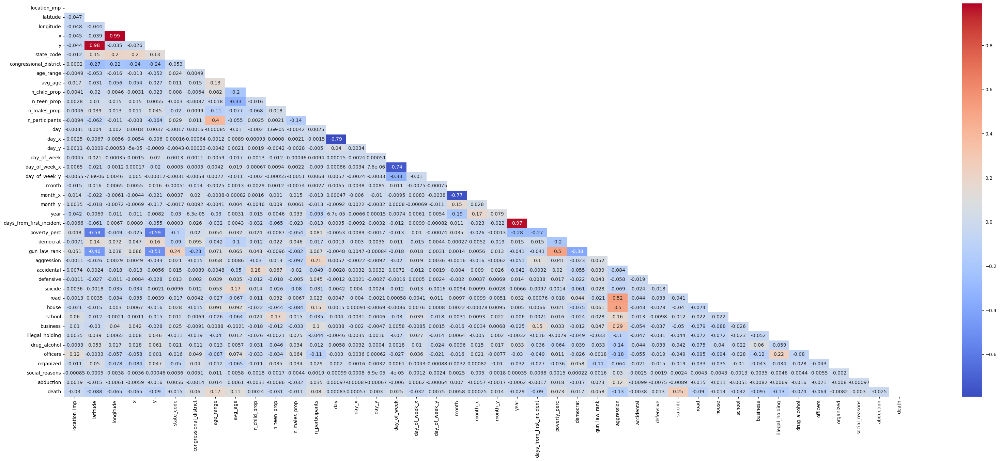

In [33]:
# compute the pearson's correlation coefficient
fig, ax = plt.subplots(figsize=(40, 15))
pearson_corr_matrix = incidents_df[indicators_names + ['death']].corr('pearson')
sns.heatmap(pearson_corr_matrix, annot=True, ax=ax, mask=np.triu(pearson_corr_matrix), cmap='coolwarm')

<Axes: >

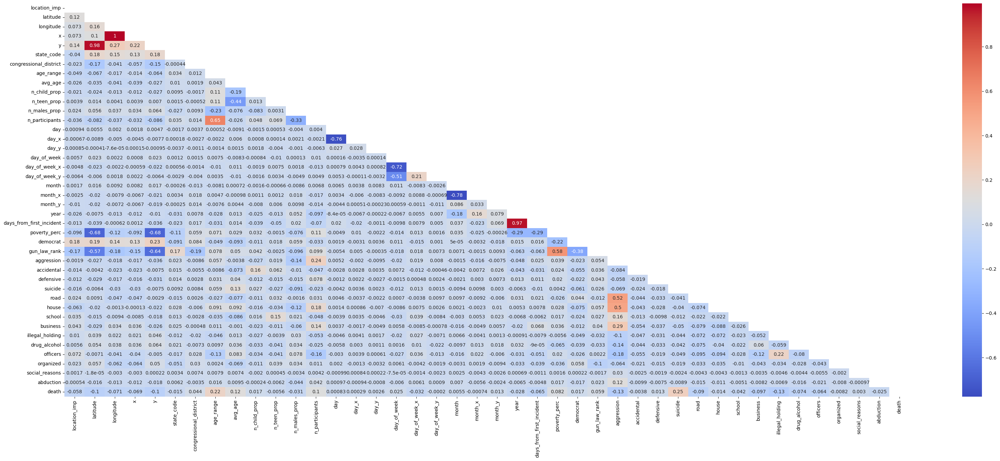

In [34]:
# compute the spearman's correlation coefficient
fig, ax = plt.subplots(figsize=(40, 15))
spearman_corr_matrix = incidents_df[indicators_names + ['death']].corr('spearman')
sns.heatmap(spearman_corr_matrix, annot=True, ax=ax, mask=np.triu(spearman_corr_matrix), cmap='coolwarm')

We observe a correlation between:
- poverty percentage, gun_law_rank and latitude (southern states are more poor and have less strict gun laws)
- road, house and aggression (when the tag aggression could be inferred also the place where the incident happened was known)

We check for duplicated rows:

In [35]:
n_duplicates = incidents_df[indicators_names].duplicated().sum()
print(f"Number of duplicated rows: {n_duplicates}")
print(f"Percentage of duplicated rows: {(n_duplicates/incidents_df[indicators_names].shape[0])*100:.2f}%")

Number of duplicated rows: 463
Percentage of duplicated rows: 0.19%


We visualize the number of nan values for each indicator:

In [36]:
incidents_df[indicators_names].info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 239372 entries, 0 to 239371
Data columns (total 41 columns):
 #   Column                    Non-Null Count   Dtype  
---  ------                    --------------   -----  
 0   location_imp              226576 non-null  float64
 1   latitude                  226576 non-null  float64
 2   longitude                 226576 non-null  float64
 3   x                         226576 non-null  float64
 4   y                         226576 non-null  float64
 5   state_code                239372 non-null  int8   
 6   congressional_district    231690 non-null  float64
 7   age_range                 144854 non-null  float64
 8   avg_age                   144854 non-null  float64
 9   n_child_prop              197942 non-null  float64
 10  n_teen_prop               197942 non-null  float64
 11  n_males_prop              198131 non-null  float64
 12  n_participants            214745 non-null  float64
 13  day                       239372 non-null  i

In [37]:
print(f'The dataset has {incidents_df.shape[0]} rows')
print(f'Dropping rows with nan values in the indicators columns, {incidents_df[indicators_names].dropna().shape[0]} rows remain')

The dataset has 239372 rows
Dropping rows with nan values in the indicators columns, 132142 rows remain


We display a summary of the descriptive statistics of the indicators:

In [38]:
incidents_df[indicators_names].describe()

,location_imp,latitude,longitude,x,y,state_code,congressional_district,age_range,avg_age,n_child_prop,n_teen_prop,n_males_prop,n_participants,day,day_x,day_y,day_of_week,day_of_week_x,day_of_week_y,month,month_x,month_y,year,days_from_first_incident,poverty_perc,democrat,gun_law_rank,aggression,accidental,defensive,suicide,road,house,school,business,illegal_holding,drug_alcohol,officers,organized,social_reasons,abduction
count,2.265760e+05,226576.000000,226576.000000,2.265760e+05,2.265760e+05,239372.000000,231690.000000,144854.000000,144854.000000,197942.000000,197942.000000,198131.000000,214745.000000,239372.000000,2.393720e+05,239372.000000,239372.000000,239372.000000,239372.000000,239372.000000,2.393720e+05,2.393720e+05,216364.000000,239372.000000,216364.000000,208700.000000,216364.000000,239372.000000,239372.000000,239372.000000,239372.000000,239372.000000,239372.000000,239372.000000,239372.000000,239372.000000,239372.000000,239372.000000,239372.000000,239372.000000,239372.000000
mean,1.605719e-02,37.542787,-89.299132,1.363330e+06,4.297744e+06,23.558357,7.918003,3.502886,30.179885,0.009704,0.061361,0.871086,1.826529,15.777088,-3.499369e-03,-0.015200,3.056059,-0.020177,0.013492,6.352857,8.697516e-03,-4.696956e-03,2015.854116,1693.645748,12.567758,0.572511,9.127249,0.215334,0.024869,0.014279,0.022166,0.069674,0.068529,0.006588,0.101954,0.079120,0.071341,0.107836,0.016280,0.000246,0.003831
std,5.268730e-02,5.090439,14.251993,1.218153e+06,6.269446e+05,14.424554,8.487186,8.200534,12.382998,0.088880,0.224414,0.261104,1.185155,8.827226,7.110099e-01,0.703012,2.023564,0.712704,0.701048,3.448250,7.121568e-01,7.019538e-01,1.195525,1511.848802,2.723749,0.494715,4.259448,0.411055,0.155727,0.118639,0.147225,0.254597,0.252653,0.080899,0.302589,0.269926,0.257394,0.310174,0.126551,0.015698,0.061775
min,1.000000e-07,19.111400,-166.541000,-6.662113e+06,2.827495e+06,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,1.000000,-9.987165e-01,-0.994869,0.000000,-0.974928,-0.900969,1.000000,-1.000000e+00,-1.000000e+00,2013.000000,0.000000,5.400000,0.000000,2.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,1.000000e-07,33.916200,-94.070550,9.415919e+05,3.867983e+06,10.000000,2.000000,0.000000,21.000000,0.000000,0.000000,1.000000,1.000000,8.000000,-7.247928e-01,-0.758758,1.000000,-0.781831,-0.900969,3.000000,-8.660254e-01,-5.000000e-01,2015.000000,922.000000,10.700000,0.000000,4.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,1.000000e-05,38.588800,-86.251300,1.627557e+06,4.373898e+06,22.000000,5.000000,0.000000,27.000000,0.000000,0.000000,1.000000,2.000000,16.000000,-2.449294e-16,-0.050649,3.000000,0.000000,-0.222521,6.000000,1.224647e-16,6.123234e-17,2016.000000,1333.000000,12.400000,1.000000,11.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,1.000000e-05,41.443225,-80.043950,2.255244e+06,4.709276e+06,36.000000,10.000000,3.000000,36.000000,0.000000,0.000000,1.000000,2.000000,23.000000,7.247928e-01,0.688967,5.000000,0.781831,0.623490,9.000000,8.660254e-01,5.000000e-01,2017.000000,1681.000000,14.100000,1.000000,13.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
max,7.378515e-01,71.336800,-67.271100,3.006781e+06,8.856018e+06,50.000000,53.000000,82.000000,101.000000,1.000000,1.000000,1.000000,103.000000,31.000000,9.987165e-01,1.000000,6.000000,0.974928,1.000000,12.000000,1.000000e+00,1.000000e+00,2018.000000,6540.000000,21.800000,1.000000,13.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


We drop incidents having at least a nan indicator:

In [39]:
incidents_clf = incidents_df.dropna(subset=indicators_names).copy()
incidents_clf.drop_duplicates(subset=indicators_names, inplace=True) # same x, y, data, characteristics, etc. cannot be different incidents
incidents_nan = incidents_df[incidents_df[indicators_names].isna().any(axis=1)]

We save all the names of the indicators in a json file:

In [40]:
with open('../data/clf_indicators_names.json', 'w') as f:
    json.dump(indicators_names, f)

We visualize the distribution of mortal incidents:

<Axes: title={'center': 'Death distribution (all incidents)'}, ylabel='death'>

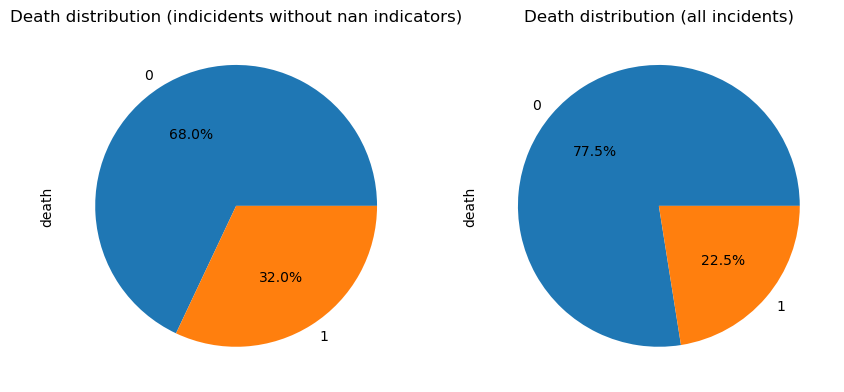

In [41]:
fig, ax = plt.subplots(1, 2, figsize=(10, 5))
incidents_clf['death'].value_counts().plot.pie(autopct='%1.1f%%', ax=ax[0], title='Death distribution (indicidents without nan indicators)')
incidents_df['death'].value_counts().plot.pie(autopct='%1.1f%%', ax=ax[1], title='Death distribution (all incidents)')

We visualize the distribution of the incidents tag in the whole dataset and in the subset of mortal incidents:

Text(0.5, 1.0, 'Mortal Incidents characteristic distribution')

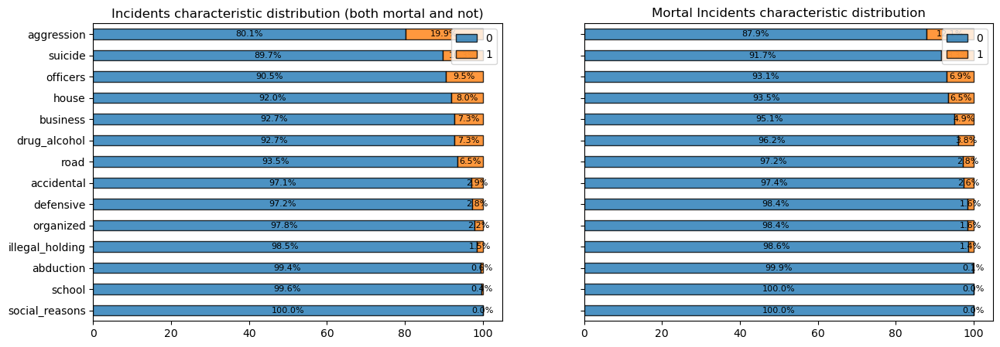

In [42]:
fig, axs = plt.subplots(1, 2, figsize=(15, 5), sharey=True)

plot1 = (incidents_clf[TagForClassification._member_names_].apply(lambda col: col.value_counts()).T.sort_values(by=1)/incidents_clf.shape[0]*100).plot(kind='barh', stacked=True, alpha=0.8, edgecolor='black', ax=axs[0])
for container in plot1.containers:
    plot1.bar_label(container, fmt='%.1f%%', label_type='center', fontsize=8)
axs[0].set_title("Incidents characteristic distribution (both mortal and not)")

plot2 = (incidents_clf[incidents_clf['death']==1][TagForClassification._member_names_].apply(lambda col: col.value_counts()).T.sort_values(by=1)/incidents_clf[incidents_clf['death']==1].shape[0]*100).plot(kind='barh', stacked=True, alpha=0.8, edgecolor='black', ax=axs[1])
for container in plot2.containers:
    plot2.bar_label(container, fmt='%.1f%%', label_type='center', fontsize=8)
axs[1].set_title("Mortal Incidents characteristic distribution")

We check how many mortal incidents happened in a school:

In [43]:
incidents_clf[(incidents_clf['death']==1) & (incidents_clf['school']==1)].shape[0]

17

We check the distribution of mortal incidents among the incident with unknown type:

<Axes: title={'center': 'Death distribution (indicidents with unknown type)'}, ylabel='death'>

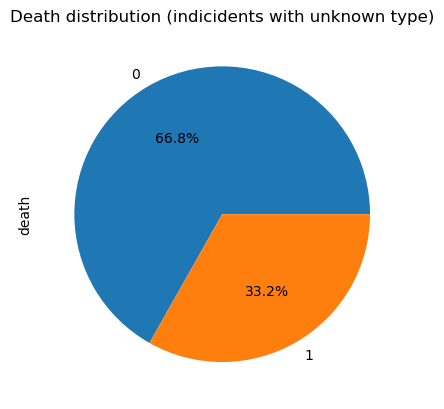

In [44]:
incidents_clf[
    (incidents_clf['aggression']==0) &
    (incidents_clf['accidental']==0) &
    (incidents_clf['defensive']==0) &
    (incidents_clf['suicide']==0)
]['death'].value_counts().plot.pie(autopct='%1.1f%%', title='Death distribution (indicidents with unknown type)')

In [45]:
(   incidents_clf[(incidents_clf['suicide']==1) & (incidents_clf['death']==0)].shape[0] / \
    incidents_clf[(incidents_clf['suicide']==1) & (incidents_clf['death']==1)].shape[0]
)*100

6.262510723477266

Visualize incidents in PCA space:

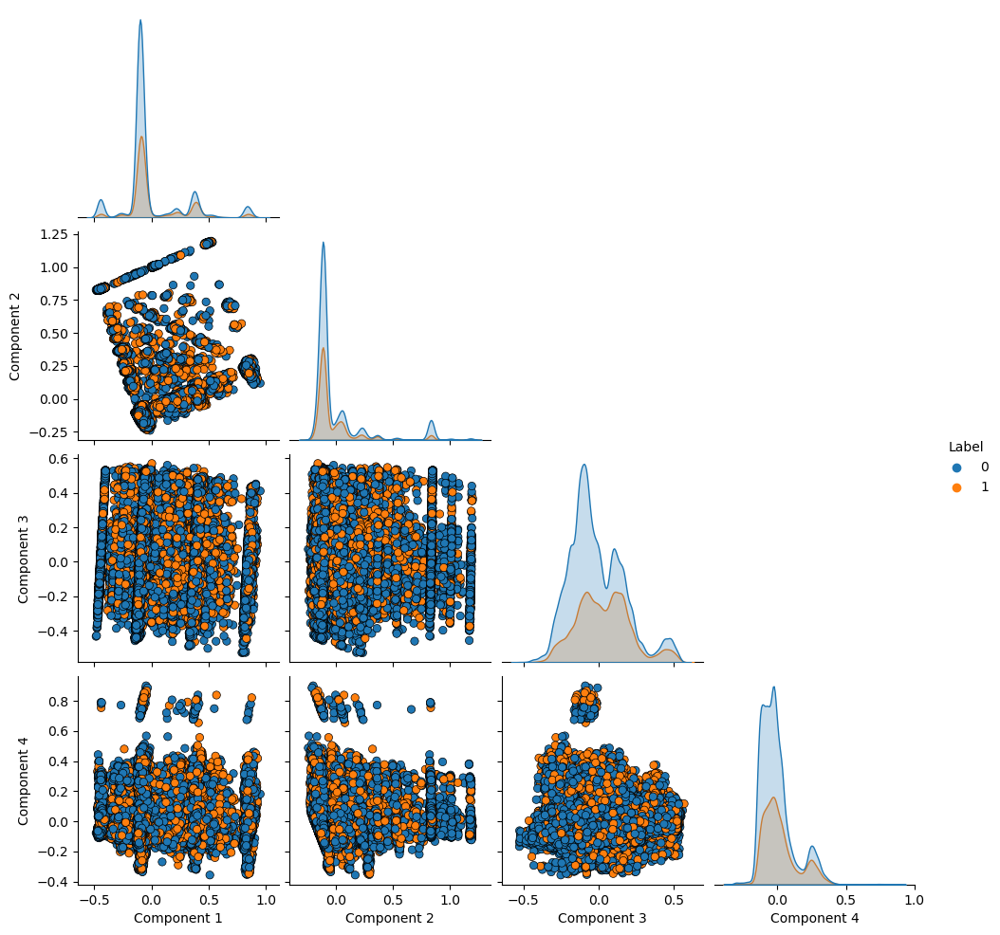

In [46]:
pca = PCA()
std_scaler = MinMaxScaler()
numeric_indicators = ['location_imp', 'x', 'y', 'age_range', 'avg_age', 'n_child_prop', 'n_teen_prop', 'n_males_prop', 'n_participants', 'poverty_perc']
X_minmax = std_scaler.fit_transform(incidents_clf[numeric_indicators].values)
X_pca = pca.fit_transform(X_minmax)
scatter_pca_features_by_label(
    X_pca,
    n_components=4,
    labels=incidents_clf['death'].values,
    palette=sns.color_palette(n_colors=2)
)

Visualize distribution of the indicators in the first and second principal components space:

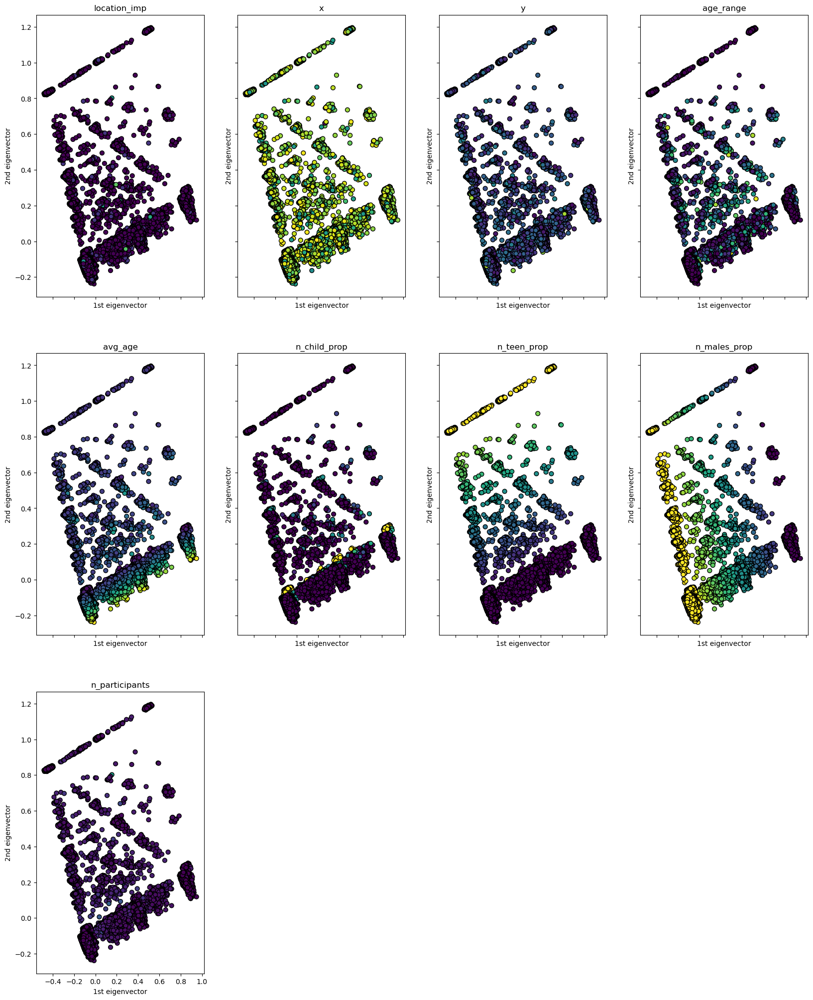

In [47]:
nplots = len(numeric_indicators)
ncols = 4
nrows = int(nplots/ncols)
if nplots % ncols != 0:
    nrows += 1
fig, axs = plt.subplots(nrows=nrows, ncols=ncols, figsize=(20, 25), sharex=True, sharey=True)
for i, col in enumerate(numeric_indicators):
    axs[int(i/ncols)][i%ncols].scatter(X_pca[:, 0], X_pca[:, 1], edgecolor='k', s=40, c=incidents_clf[col], cmap='viridis')
    axs[int(i/ncols)][i%ncols].set_title(col)
    axs[int(i/ncols)][i%ncols].set_xlabel("1st eigenvector")
    axs[int(i/ncols)][i%ncols].set_ylabel("2nd eigenvector")
if nrows > 1:
    for ax in axs[nrows-1, i%ncols:]:
        ax.remove()

The first two principal components are correlated with the age and gender attributes.

Visualize distribution of the indicators in the first and third principal components space:

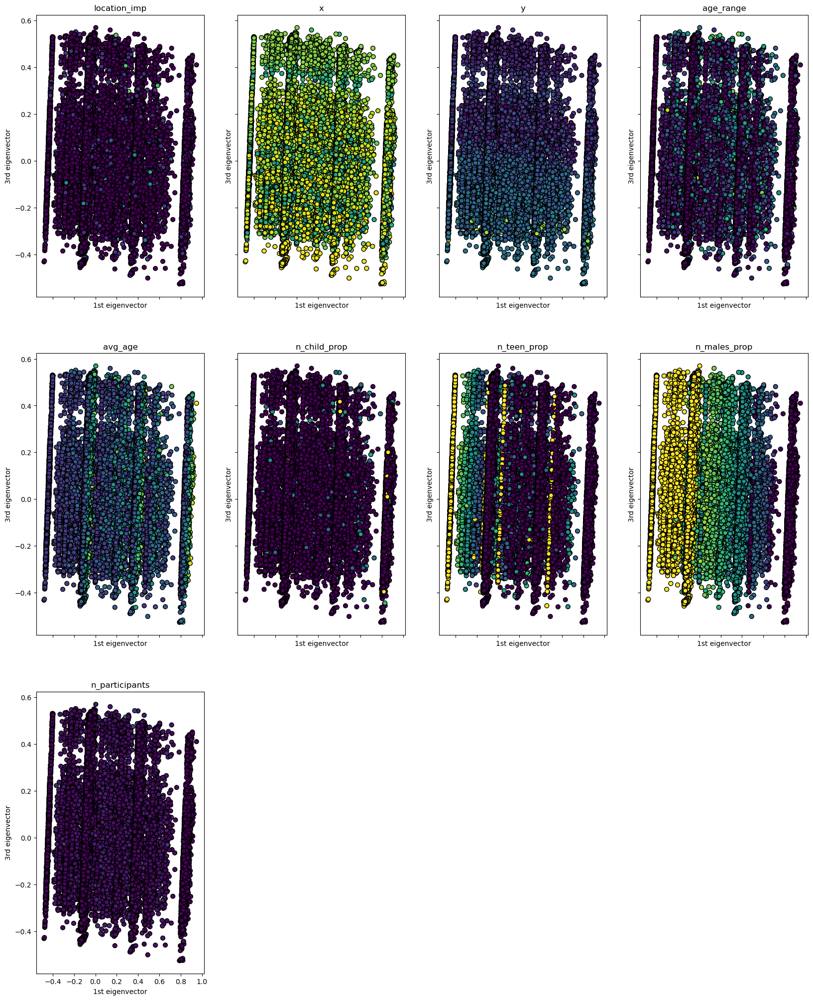

In [48]:
nplots = len(numeric_indicators)
ncols = 4
nrows = int(nplots/ncols)
if nplots % ncols != 0:
    nrows += 1
fig, axs = plt.subplots(nrows=nrows, ncols=ncols, figsize=(20, 25), sharex=True, sharey=True)
for i, col in enumerate(numeric_indicators):
    axs[int(i/ncols)][i%ncols].scatter(X_pca[:, 0], X_pca[:, 2], edgecolor='k', s=40, c=incidents_clf[col], cmap='viridis')
    axs[int(i/ncols)][i%ncols].set_title(col)
    axs[int(i/ncols)][i%ncols].set_xlabel("1st eigenvector")
    axs[int(i/ncols)][i%ncols].set_ylabel("3rd eigenvector")
if nrows > 1:
    for ax in axs[nrows-1, i%ncols:]:
        ax.remove()

Visualize distribution of the indicators in the second and third principal components space:

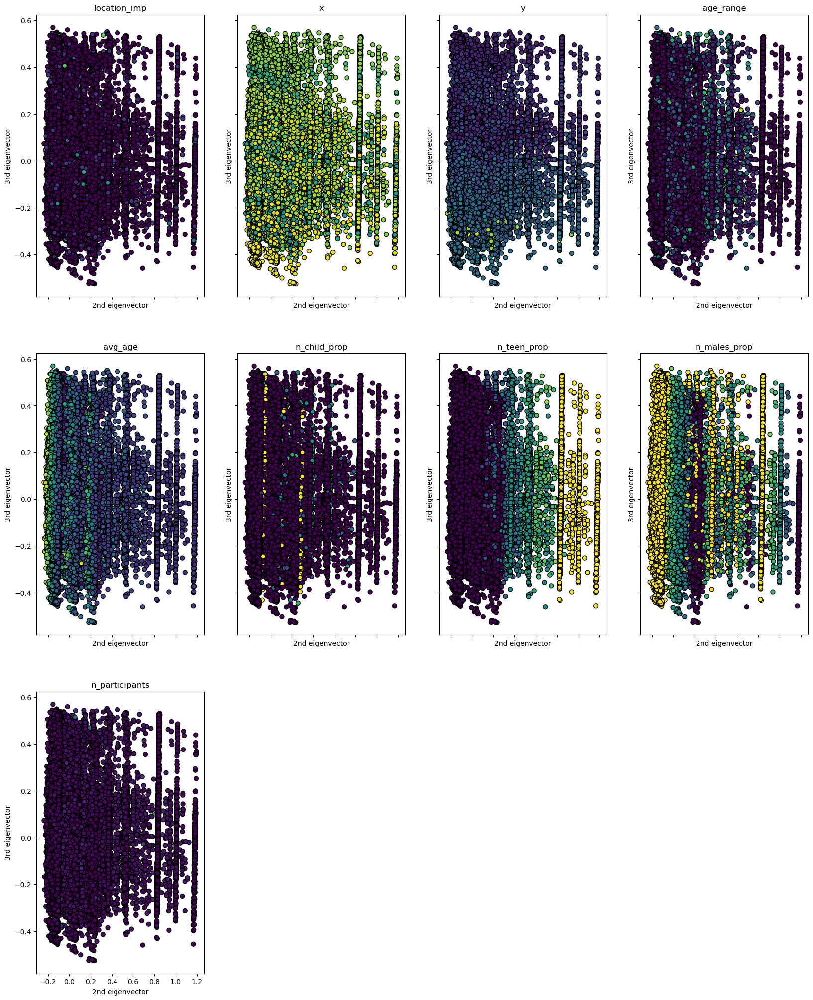

In [49]:
nplots = len(numeric_indicators)
ncols = 4
nrows = int(nplots/ncols)
if nplots % ncols != 0:
    nrows += 1
fig, axs = plt.subplots(nrows=nrows, ncols=ncols, figsize=(20, 25), sharex=True, sharey=True)
for i, col in enumerate(numeric_indicators):
    axs[int(i/ncols)][i%ncols].scatter(X_pca[:, 1], X_pca[:, 2], edgecolor='k', s=40, c=incidents_clf[col], cmap='viridis')
    axs[int(i/ncols)][i%ncols].set_title(col)
    axs[int(i/ncols)][i%ncols].set_xlabel("2nd eigenvector")
    axs[int(i/ncols)][i%ncols].set_ylabel("3rd eigenvector")
if nrows > 1:
    for ax in axs[nrows-1, i%ncols:]:
        ax.remove()

The third principal components does not seem to be correlated with any indicator.

We split the dataset in a train set (including 0.75% of the records) and a test test (including the remainig 0.25% of the records), stratifiying the split according to the label to predict, and we save the sets in csv files:

In [50]:
original_features_minus_indicators = [feature for feature in dataset_original_columns if feature not in indicators_names]
incidents_clf = incidents_clf[original_features_minus_indicators + indicators_names + ['death']]
incidents_nan = incidents_nan[original_features_minus_indicators + indicators_names + ['death']]
X_train_df, X_test_df, y_train, y_test = train_test_split(
    incidents_clf.drop(columns='death'),
    incidents_clf['death'],
    test_size=1/3,
    random_state=42,
    shuffle=True,
    stratify=incidents_clf['death'].values
)
pd.concat([X_train_df, incidents_nan.drop(columns='death')]).to_csv('../data/clf_indicators_train_nan.csv')
pd.concat([y_train, incidents_nan['death']]).to_csv('../data/clf_y_train_nan.csv')
X_train_df.to_csv('../data/clf_indicators_train.csv')
X_test_df.to_csv('../data/clf_indicators_test.csv')
y_train.to_csv('../data/clf_y_train.csv')
y_test.to_csv('../data/clf_y_test.csv')

We display the distributions of the indicators:

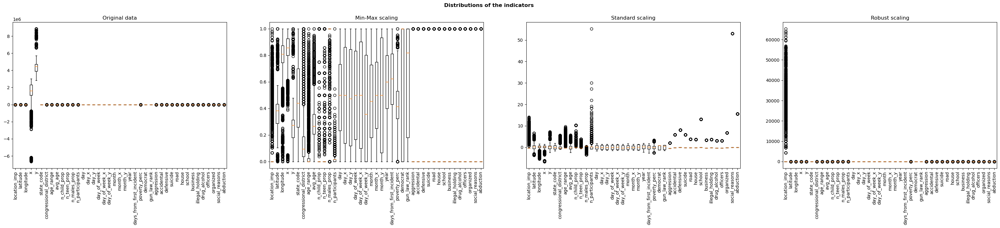

In [51]:
# apply MinMaxScaler
minmax_scaler = MinMaxScaler()
X_minmax = minmax_scaler.fit_transform(incidents_clf[indicators_names])
# apply StandardScaler
std_scaler = StandardScaler()
X_std = std_scaler.fit_transform(incidents_clf[indicators_names])
# apply RobustScaler
robust_scaler = RobustScaler()
X_robust = robust_scaler.fit_transform(incidents_clf[indicators_names])
# plot the distributions of the indicators after the transformations
fig, axs = plt.subplots(nrows=1, ncols=4, figsize=(40, 6))
axs[0].boxplot(incidents_clf[indicators_names])
axs[0].set_xticklabels(indicators_names, rotation=90);
axs[0].set_title('Original data');
axs[1].boxplot(X_minmax)
axs[1].set_xticklabels(indicators_names, rotation=90);
axs[1].set_title('Min-Max scaling');
axs[2].boxplot(X_std)
axs[2].set_xticklabels(indicators_names, rotation=90);
axs[2].set_title('Standard scaling');
axs[3].boxplot(X_robust)
axs[3].set_xticklabels(indicators_names, rotation=90);
axs[3].set_title('Robust scaling');
fig.suptitle('Distributions of the indicators', fontweight='bold');

We apply Min-Max scaling:

In [52]:
minmax_scaler.fit(X_train_df[indicators_names])
X_test_transf = minmax_scaler.transform(X_test_df[indicators_names])
X_test_df[indicators_names] = X_test_transf
X_test_df.to_csv('../data/clf_scaled_indicators_test.csv')

<Axes: >

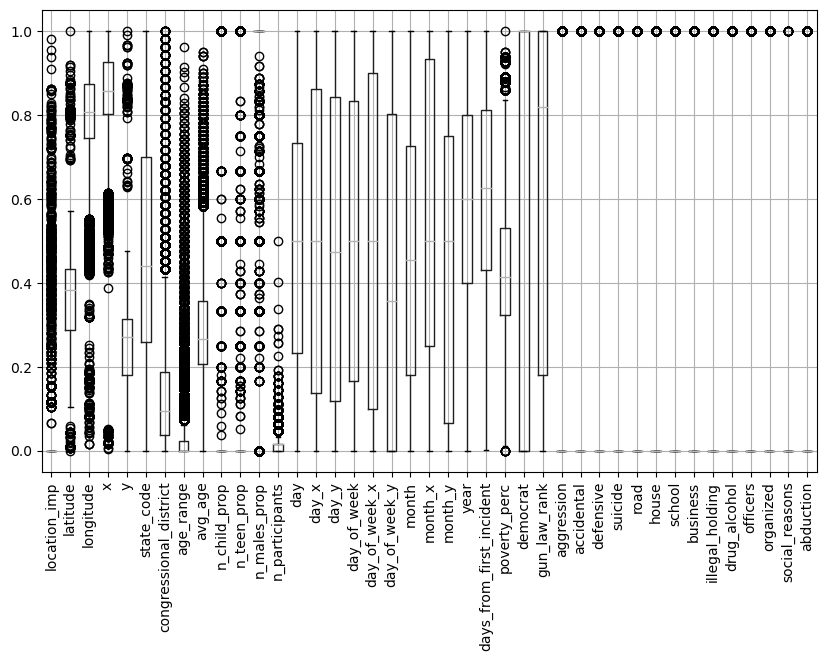

In [53]:
fig, axs = plt.subplots(figsize=(10, 6))
X_test_df[indicators_names].boxplot(ax=axs, rot=90)

We display train and test sizes:

In [54]:
train_test_infos = {}
train_test_infos['Fatal'] = [y_train.sum(), y_test.sum()]
train_test_infos['Fatal (%)'] = [y_train.sum()/y_train.shape[0]*100, y_test.sum()/y_test.shape[0]*100]
train_test_infos['Non-Fatal'] = [(y_train == False).sum(), (y_test == False).sum()]
train_test_infos['Non-Fatal (%)'] = [(y_train == False).sum()/y_train.shape[0]*100, (y_test == False).sum()/y_test.shape[0]*100]
train_test_infos['total'] = [X_train_df.shape[0], X_test_df.shape[0]]
pd.DataFrame(train_test_infos, index=['train', 'test'])

,Fatal,Fatal (%),Non-Fatal,Non-Fatal (%),total
train,28175,32.013408,59835,67.986592,88010
test,14087,32.012271,29918,67.987729,44005


We write to json files the names of the features to use with distance or rule based classifiers:

In [55]:
# distance based features
features_db = [
    'location_imp', 'x', 'y',
    'age_range', 'avg_age', 'n_child_prop', 'n_teen_prop', 
    'n_males_prop',
    'n_participants',
    'day_x', 'day_y', 'day_of_week_x', 'day_of_week_y', 'month_x', 'month_y', 'year', 'days_from_first_incident',
    'poverty_perc', 'democrat', 'gun_law_rank', 
    'aggression', 'accidental', 'defensive', 'suicide', 'road', 'house', 'school', 'business', 'illegal_holding', 'drug_alcohol', 'officers', 'organized', 'social_reasons', 'abduction'
]

with open('../data/clf_indicators_names_distance_based.json', 'w') as f:
    json.dump(features_db, f)

# rule based features
features_rb = [
    'location_imp', 'x', 'y',
    'age_range', 'avg_age', 'n_child_prop', 'n_teen_prop',
    'n_males_prop',
    'n_participants',
    'day', 'day_of_week', 'month', 'year', 'days_from_first_incident',
    'poverty_perc', 'democrat', 'gun_law_rank',
    'aggression', 'accidental', 'defensive', 'suicide', 'road', 'house', 'school', 'business', 'illegal_holding', 'drug_alcohol', 'officers', 'organized', 'social_reasons', 'abduction'
]

categorical_features_rb = [
    'day', 'day_of_week', 'month', 'year',
    'democrat', 'gun_law_rank',
    'aggression', 'accidental', 'defensive', 'suicide',
    'road', 'house', 'school', 'business',
    'illegal_holding', 'drug_alcohol', 'officers', 'organized', 'social_reasons', 'abduction'
]

with open('../data/clf_indicators_names_rule_based.json', 'w') as f:
    json.dump(features_rb, f)

We perform Random over-sampling:

In [56]:
oversample = RandomOverSampler(sampling_strategy=0.4/0.6)
X_train_over_df, y_train_over = oversample.fit_resample(X_train_df, y_train)

X_train_over_df.to_csv('../data/clf_indicators_train_over.csv')
y_train_over.to_csv('../data/clf_y_train_over.csv')

train_over_infos = {}
train_over_infos['Fatal'] = [y_train_over.sum()]
train_over_infos['Fatal (%)'] = [(y_train_over.sum()/y_train_over.shape[0])*100]
train_over_infos['Non_Fatal'] = [(y_train_over == 0).sum()]
train_over_infos['Non_Fatal (%)'] = [((y_train_over == 0).sum()/y_train_over.shape[0])*100]
train_over_infos['total'] = [y_train_over.shape[0]]
pd.DataFrame(train_over_infos, index=['train'])

,Fatal,Fatal (%),Non_Fatal,Non_Fatal (%),total
train,39890,40.0,59835,60.0,99725


We perform oversampling using SMOTE, taking into account categorical attributes:

In [57]:
smote_oversample = SMOTENC(categorical_features=categorical_features_rb, sampling_strategy=0.4/0.6)
X_train_smote_df, y_train_smote = smote_oversample.fit_resample(X_train_df[features_rb], y_train)
# recompute splitted indicators
X_train_smote_df['month_x'] = np.sin(2 * np.pi * X_train_smote_df['month'] / 12.0)
X_train_smote_df['month_y'] = np.cos(2 * np.pi * X_train_smote_df['month'] / 12.0)
X_train_smote_df['day_x'] = np.sin(2 * np.pi * X_train_smote_df['day'] / 31.0)
X_train_smote_df['day_y'] = np.cos(2 * np.pi * X_train_smote_df['day'] / 31.0)
X_train_smote_df['day_of_week_x'] = np.sin(2 * np.pi * X_train_smote_df['day_of_week'] / 7.0)
X_train_smote_df['day_of_week_y'] = np.cos(2 * np.pi * X_train_smote_df['day_of_week'] / 7.0)

X_train_smote_df.to_csv('../data/clf_indicators_train_smote.csv')
y_train_smote.to_csv('../data/clf_y_train_smote.csv')

train_smote_infos = {}
train_smote_infos['Fatal'] = [y_train_smote.sum()]
train_smote_infos['Fatal (%)'] = [(y_train_smote.sum()/y_train_smote.shape[0])*100]
train_smote_infos['Non_Fatal'] = [(y_train_smote == 0).sum()]
train_smote_infos['Non_Fatal (%)'] = [((y_train_smote == 0).sum()/y_train_smote.shape[0])*100]
train_smote_infos['total'] = [y_train_smote.shape[0]]
pd.DataFrame(train_smote_infos, index=['train'])

,Fatal,Fatal (%),Non_Fatal,Non_Fatal (%),total
train,39890,40.0,59835,60.0,99725


We define a function to compute and save the most frequent values for each feature:

In [58]:
def save_freq_feature_values(df, path):
    # compute the most frequent value for each feature
    freq = df.agg(lambda x: x.value_counts().index[0])
    if 'day_of_week_x' in df.columns: # distance based features
        freq_day_of_week_x, freq_day_of_week_y = df.groupby(["day_of_week_x", "day_of_week_y"]).size().sort_values(ascending=False).index[0]
        freq['day_of_week_x'] = freq_day_of_week_x
        freq['day_of_week_y'] = freq_day_of_week_y
        freq_day_x, freq_day_y = df.groupby(["day_x", "day_y"]).size().sort_values(ascending=False).index[0]
        freq['day_x'] = freq_day_x
        freq['day_y'] = freq_day_y
        freq_month_x, freq_month_y = df.groupby(["month_x", "month_y"]).size().sort_values(ascending=False).index[0]
        freq['month_x'] = freq_month_x
        freq['month_y'] = freq_month_y
    freq.to_frame().T.to_csv(path, index=False)

We apply that function to compute the most frequent values for each feature in fatal and non-fatal incidents:

In [59]:
save_freq_feature_values(df=X_train_df[y_train==1][features_rb], path='../data/classification_results/fatal_rb_default_features.csv')
save_freq_feature_values(df=X_train_df[y_train==0][features_rb], path='../data/classification_results/non_fatal_rb_default_features.csv')
save_freq_feature_values(df=X_train_df[y_train==1][features_db], path='../data/classification_results/fatal_db_default_features.csv')
save_freq_feature_values(df=X_train_df[y_train==0][features_db], path='../data/classification_results/non_fatal_db_default_features.csv')

In [60]:
default_rb = X_train_df[features_rb].median()
default_rb.to_frame().T.to_csv('../data/classification_results/rb_default_features.csv', index=False)

default_db = X_train_df[features_db].median()

default_db['day_x'] = np.sin(2 * np.pi * default_rb['day'] / 31.0)
default_db['day_y'] = np.cos(2 * np.pi * default_rb['day'] / 31.0)

default_db['day_of_week_x'] = np.sin(2 * np.pi * default_rb['day_of_week'] / 31.0)
default_db['day_of_week_y'] = np.cos(2 * np.pi * default_rb['day_of_week'] / 31.0)

default_db['month_x'] = np.sin(2 * np.pi * default_rb['month'] / 31.0)
default_db['month_y'] = np.cos(2 * np.pi * default_rb['month'] / 31.0)

default_db.to_frame().T.to_csv('../data/classification_results/db_default_features.csv', index=False)

TODO: compilare una volta definiti

# Final Indicators semantics
| Name | Description | Present in the original dataset |
| :--: | :---------: | :-----------------------------: |
| location_imp | Location importance according to Geopy | No |
| latitude | Latitude of the incident | Yes |
| longitude | Longitude of the incident | Yes |
| x | Projection of the longitude of the incident | No |
| y | Projection of the latitude of the incident | No |
| age_range | Difference between the maximum and the minimum age of the participants involved in the incident | No |
| avg_age | Average age of the participants involved in the incident | Yes |
| n_child_prop | Ratio between the number of child involved in the incident and number of people involved in the incident | No |
| n_teen_prop | Ratio between the number of teen involved in the incident and number of people involved in the incident | No |
| n_males_prop | Ratio between the number of males and the number of people involed in the incident | No |
| n_participants | Number of participants involved in the incident | Yes |
| month | Month in which the incident happened | Yes (in date) |
| day_of_week | Day of the week in which the incident happened | | No (computed from date) |
| poverty_perc | Poverty percentage in the state and year of the incident | Yes |
| democrat | Winning party in the congressional_district and year of the incident | Yes |
| aggression | Whether the incident involved an aggression (both with a gun or not) | No (extracted from the incident characteristics) |
| road | Whether the incident happened in a road | No (extracted from the incident characteristics) |
| illegal_holding | Whether the incident involved a stealing act or a gun was illegally possessed | No (extracted from the incident characteristics) |
| house | Whether the incident happened in a house | No (extracted from the incident characteristics) |
| school | Whether the incident happened in a school | No (extracted from the incident characteristics) |
| drugs | Whether the incident involved drugs | No (extracted from the incident characteristics) |
| officers | Whether one or more officiers were involved in the incident | No (extracted from the incident characteristics) |
| organized | Whether the action was planned by an organization or a group | No (extracted from the incident characteristics) |
| social_reasons | Whether the incident involved social discriminations or terrorism | No (extracted from the incident characteristics) |
| defensive | Whether the incident involved the use of a gun for defensive purposes | No (extracted from the incident characteristics) |
| workplace | Whether the incident happened in a workplace | No (extracted from the incident characteristics) |
| abduction | Whether the incident involved any form of abduction | No (extracted from the incident characteristics) |
| unintentional | Whether the incident was unintentional | No (extracted from the incident characteristics) |